# Capstone Two - 11.5 Exploratory Data Analysis

*this is a final version of the process, I will add notes describing any details from the initial EDA procedure*

*longer plotting operations have a `%%time` on their cells, that way a reader can consider looking at the locally saved graph instead of repeating the operation*

***DO FINAL CHECK AFTER FINISHED***

#### Contents
- [Data Loading, Final Cleaning](#Load-Data)
- [Target Features](#Target-Features)
- [Initial Exploration](#Initial-Exploration)
- [Derived Features, Repeat](#Derived-Features)
- [Principal Component Analysis](#PCA)
- [Connclusions](#Findings)

## Load Data 
 - simple exploration of team info, focus on team game statistics
 - cleanse data of previosly marked "Null" values, `-1`
   - remove seasons (years) with mostly incomplete data
     - first two years: 2012, 2013
   - *later* chop missing Huck, Redzone data (data only collected > 2019) or features entirely
     - leave for now for more complete assessment of other features
     - consider using later

In [2]:
# import libraries
import requests
import json
import pandas as pd
from tqdm import tqdm
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [89]:
from pathlib import Path

In [3]:
# load data
data = pd.read_parquet('data/clean_1/game_stats_2023-06-16.parquet')
teams = pd.read_parquet('data/clean_1/team_info_2023-06-16.parquet')


#### Simple Team Analysis
- make cool timeline of teams, when they were active.
  - add labels with info (win% or something)

In [71]:
teams.sample(4)

,abbrev,city,name,primary,secondary,home,away,games,first,last,wins,losses,ties
13,MTL,Montreal,Royal,#1D2250,#F06724,57,53,110,2014,2023,51,59,0
34,NJH,New Jersey,Hammerheads,<NA>,<NA>,8,8,16,2013,2013,2,14,0
2,ATX,Austin,Sol,#2B3283,#E74A37,44,44,88,2016,2023,40,48,0
3,CHI,Chicago,Union,#002D72,#41B6E6,67,69,136,2013,2023,76,59,1


In [54]:
# current teams
teams[teams['last']==2023].shape

(24, 13)

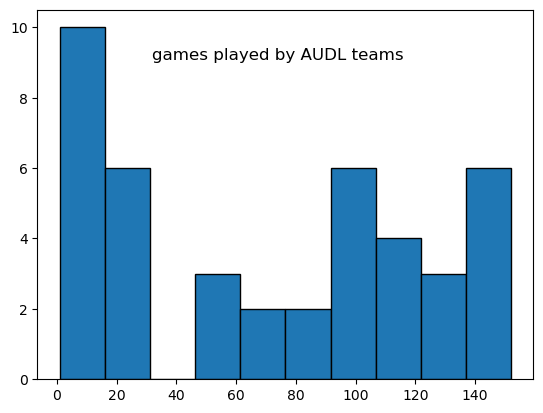

In [70]:
teams.games.hist(edgecolor='k')
plt.suptitle('games played by AUDL teams',y=0.8)
plt.grid(False)
plt.show()

In [ ]:
# Historical Teams Calendar

#### Assess "Null" Data AKA `=-1` 

In [26]:
data[data==-1].groupby(data.date.dt.year).sum(numeric_only =True).T.style\
    .background_gradient(cmap='Spectral', axis=None)\
    .format(formatter="{:.0f}")

date,2012,2013,2014,2015,2016,2017,2018,2019,2021,2022,2023
location,0,0,0,0,0,0,0,0,0,0,0
home_score,0,0,0,0,0,0,0,0,0,0,0
away_score,0,0,0,0,0,0,0,0,0,0,0
away_completions,-34,-17,-2,-2,-2,0,0,0,0,0,0
away_throws,-34,-17,-2,-2,-2,0,0,0,0,0,0
away_hucks_completed,-64,-101,-126,-185,-193,-179,-171,-132,0,0,0
away_hucks,-64,-101,-126,-185,-193,-179,-171,-132,0,0,0
away_blocks,0,0,0,0,0,0,0,0,0,0,0
away_turnovers,0,0,0,0,0,0,0,0,0,0,0
away_o_scores,-64,-101,-1,-2,-2,0,0,0,0,0,0


#### Remove 2012-2013

In [4]:
print(data.shape)
data = data[data.date.dt.year > 2013]
print('removed 2012,2013 seasons')
print(data.shape)

(1524, 37)
removed 2012,2013 seasons
(1359, 37)


In [28]:
data[data==-1].groupby(data.date.dt.year).sum(numeric_only =True).T.style\
    .background_gradient(cmap='Spectral', axis=None)\
    .format(formatter="{:.0f}")

date,2014,2015,2016,2017,2018,2019,2021,2022,2023
location,0,0,0,0,0,0,0,0,0
home_score,0,0,0,0,0,0,0,0,0
away_score,0,0,0,0,0,0,0,0,0
away_completions,-2,-2,-2,0,0,0,0,0,0
away_throws,-2,-2,-2,0,0,0,0,0,0
away_hucks_completed,-126,-185,-193,-179,-171,-132,0,0,0
away_hucks,-126,-185,-193,-179,-171,-132,0,0,0
away_blocks,0,0,0,0,0,0,0,0,0
away_turnovers,0,0,0,0,0,0,0,0,0
away_o_scores,-1,-2,-2,0,0,0,0,0,0


#### Cleaning Artifacts: replace -1 values with None 
*will change dtype of columns with empty values from int to float*

In [5]:
data.where(data != -1, np.nan, inplace=True)
print(round(100*data.isnull().sum().sum()/(data.shape[0]*data.shape[1])), 'percent data missing')

17 percent data missing


## Target Features
 - Plan for now:
   - considering each game from a particular team's (`OAK` or `DET`) perspective will invovle extra effort in separating home/away to avoid double-counting
   - will treat whole dataset as team agnostic for now, and create target features from the **home** team's perspective
     - this is how the statistics were recorded
 - Target Features for Model
   - **Home Margin**: `<home-score> - <away-score>`
     - final point differential, target for **regression** models
   - **Home Win**: `True` if `<home-score> > <away-score>`
     - final outcome, target for **logistic regression/classification** models
     - ties not considered wins for now

In [6]:
data.loc[:,'home_win'] = data.home_score > data.away_score
data.loc[:,'home_margin'] = data.home_score - data.away_score

#### `Home Win` Analysis
- basic symmetry checks
- is home field advantage a thing?

In [7]:
print(round(100*data.home_win.mean(),1), 'percent home victories')

57.6 percent home victories


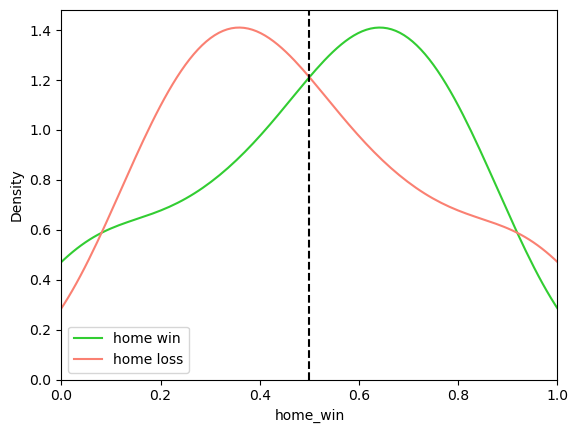

In [49]:
sns.kdeplot(x=data.groupby('home')['home_win'].mean(), label='home win', color='limegreen')
sns.kdeplot(x=1-data.groupby('home')['home_win'].mean(), label='home loss', color='salmon')
plt.axvline(x=0.5, ls='--', color='k')
plt.legend()
plt.xlim([0,1])
plt.show()

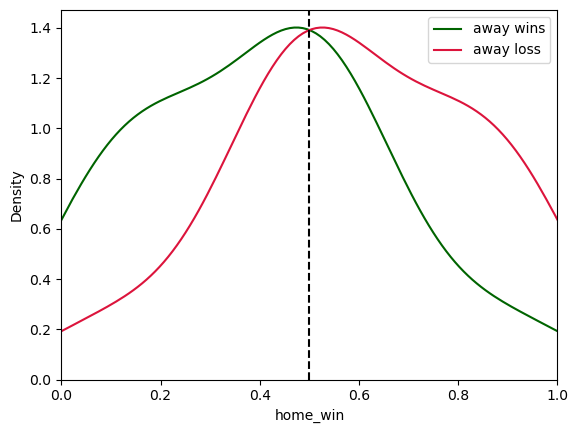

In [75]:
sns.kdeplot(x=1-data.groupby('away')['home_win'].mean(), label='away wins', color='darkgreen')
sns.kdeplot(x=data.groupby('away')['home_win'].mean(), label='away loss', color='crimson')
plt.axvline(x=0.5, ls='--', color='k')
plt.legend()
plt.xlim([0,1])
plt.show()

(0.0, 1.0)

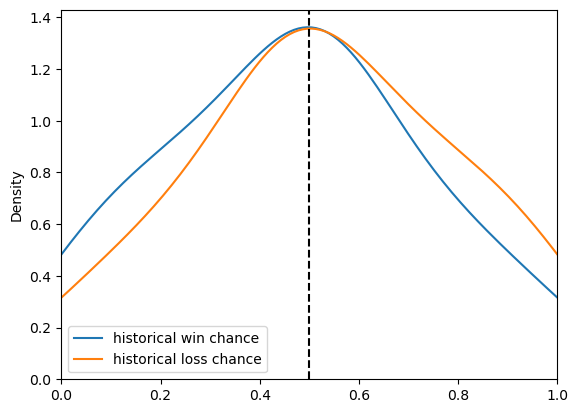

In [78]:
# historical team winning percentage
sns.kdeplot(x=np.array(teams.wins/teams.games), label='historical win chance')
sns.kdeplot(x=np.array(teams.losses/teams.games), label='historical loss chance')
plt.axvline(x=0.5, ls='--', color='k')
plt.legend()
plt.xlim([0,1])

#### `Home Margin` Analysis
- fun looking distribution, centered about 0 as one might expect
- but 0 is among the least common margins, due to the nature of the game
  - up to two overtime periods are played in an attempt to end with a victor
- correlation map shows that some features may simply have inverse relationships with home margin
  - may need to eliminate / combine some intercorrelated features later

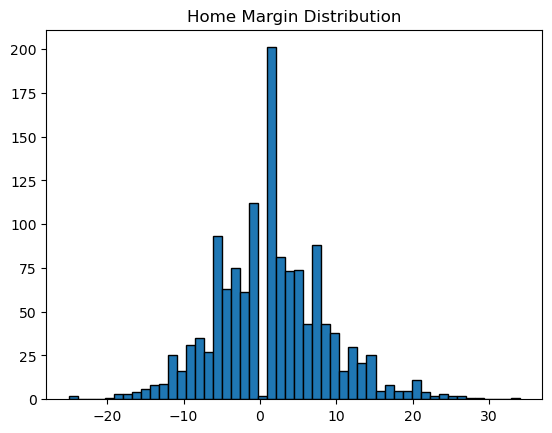

In [82]:
data['home_margin'].hist(edgecolor='k', bins=50)
plt.title('Home Margin Distribution')
plt.grid(False)
plt.show()

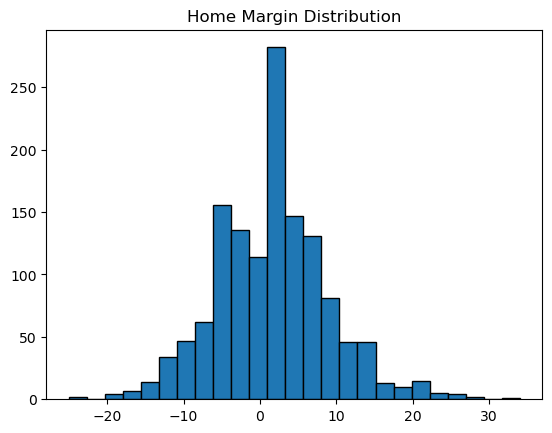

In [83]:
data['home_margin'].hist(edgecolor='k', bins=25)
plt.title('Home Margin Distribution')
plt.grid(False)
plt.show()

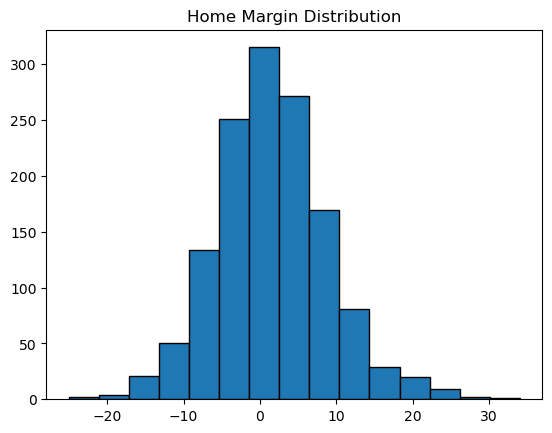

In [84]:
data['home_margin'].hist(edgecolor='k', bins=15)
plt.title('Home Margin Distribution')
plt.grid(False)
plt.show()

In [87]:
print('lowest home margins, Mechanix :(')
data.sort_values('home_margin').head()[['home_margin','home','home_score','away','away_score']]

lowest home margins, Mechanix :(


,home_margin,home,home_score,away,away_score
2068,-25,Mechanix,9,Radicals,34
2674,-24,Mechanix,10,Radicals,34
1885,-20,Breeze,17,Rush,37
1483,-19,Nightwatch,8,Legion,27
2964,-18,SW All-Stars,24,EC All-Stars,42


In [88]:
print('highest home margins, Mechanix :(')
data.sort_values('home_margin', ascending=False).head()[['home_margin','home','home_score','away','away_score']]

highest home margins, Mechanix :(


,home_margin,home,home_score,away,away_score
1725,34,Wind Chill,45,Mechanix,11
2258,29,Radicals,37,Mechanix,8
2132,28,Riptide,37,Lions,9
1739,26,Thunderbirds,42,Mechanix,16
2157,26,Wind Chill,42,Mechanix,16


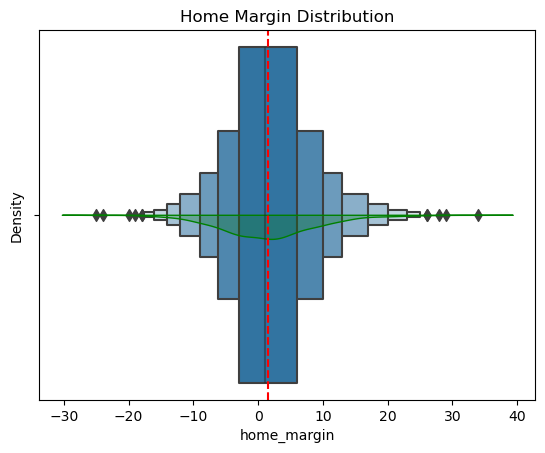

In [78]:
sns.boxenplot(x=data.home_margin)
sns.kdeplot(data.home_margin, color='g', fill=True)
plt.title('Home Margin Distribution')
plt.axvline(x=data.home_margin.mean(), c='r', linestyle='--')

In [39]:
# Correlation Table for target features
data.corr(numeric_only=True).iloc[-2:,1:].T.style\
        .background_gradient(cmap = 'PiYG', vmin=-1,vmax=1)\
        .format(formatter="{:.3f}")

,home_win,home_margin
home_score,0.559,0.725
away_score,-0.526,-0.690
away_completions,-0.033,-0.026
away_throws,0.025,0.058
away_hucks_completed,-0.112,-0.154
away_hucks,0.062,0.041
away_blocks,-0.393,-0.431
away_turnovers,0.360,0.521
away_o_scores,-0.060,-0.144
away_o_points,0.547,0.703


<Axes: >

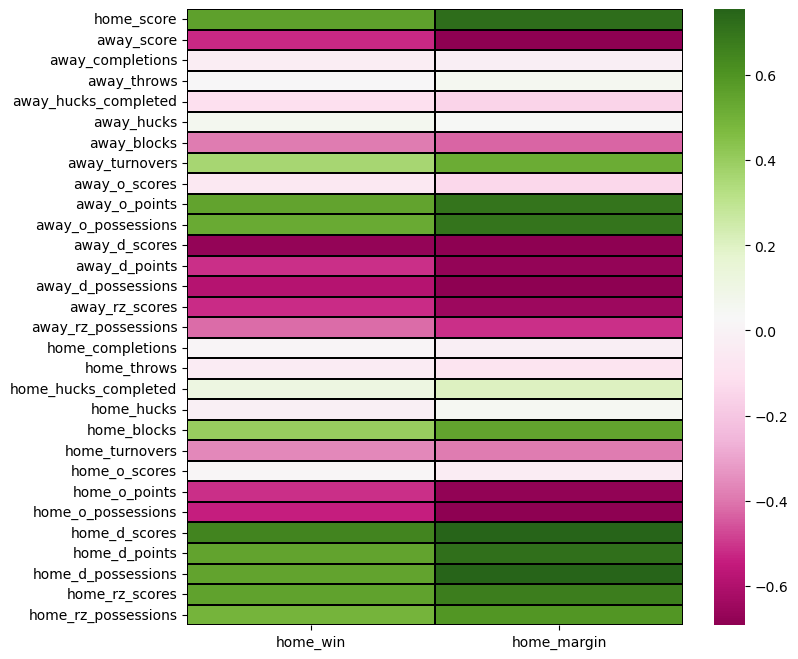

In [105]:
plt.figure(figsize=(8,8))
sns.heatmap(data.corr(numeric_only=True).iloc[-2:,1:-2].T, cmap = 'PiYG',
           linecolor='k', linewidths=0.2, robust=True)

## Initial Exploration
 - Feature distributions
   - polynomial regression fit for **Home Margin**
   - logistic regression fit for **Home Win**
   - feature vs feature Pearson correlation heat maps
   - feature vs feature *pair-plots*
     - joint-plots

In [90]:
# make directory for graphs
Path('graphs/EDA').mkdir(exist_ok=True)

In [92]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1359 entries, 2059 to 3016
Data columns (total 39 columns):
 #   Column                Non-Null Count  Dtype              
---  ------                --------------  -----              
 0   game                  1359 non-null   object             
 1   date                  1359 non-null   datetime64[ns, UTC]
 2   tz                    1359 non-null   object             
 3   location              656 non-null    float64            
 4   week                  1359 non-null   category           
 5   home                  1359 non-null   category           
 6   away                  1359 non-null   category           
 7   home_score            1359 non-null   int32              
 8   away_score            1359 non-null   int32              
 9   away_completions      1353 non-null   float64            
 10  away_throws           1353 non-null   float64            
 11  away_hucks_completed  373 non-null    float64            
 12  awa

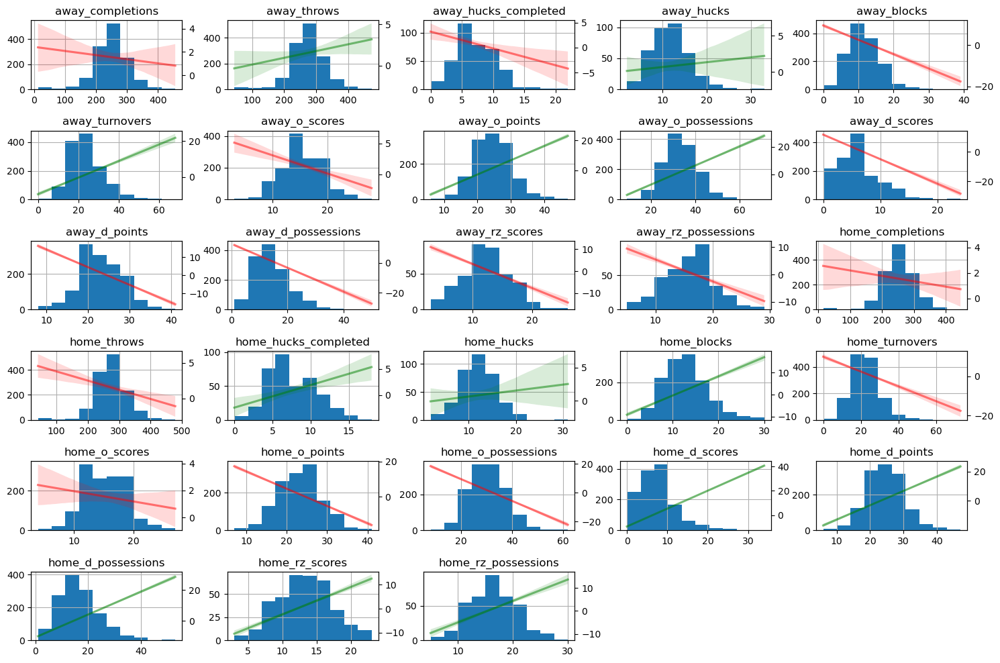

In [96]:
# all numerical feature except score
# distributions, reg fit vs home margin
x = data.iloc[:,9:37].hist(figsize=(18,12))
plt.subplots_adjust(hspace=0.6)
for row in x:
    for graph in row:
        param = graph.title.get_text()
        if param:
            # indicate positive / negative relationship with green / red
            c = 'g' if data[[param,'home_margin']].corr().iloc[0,1] > 0 else 'r' 
            sns.regplot(data, x=param, y='home_margin', scatter=False,
                   ax = graph.twinx(), color=c, line_kws=dict(alpha=0.5))
            plt.ylabel('')

plt.savefig(Path('graphs/EDA/basic_features_hist_vs_margin.png'), dpi=300, bbox_inches='tight')
plt.show()

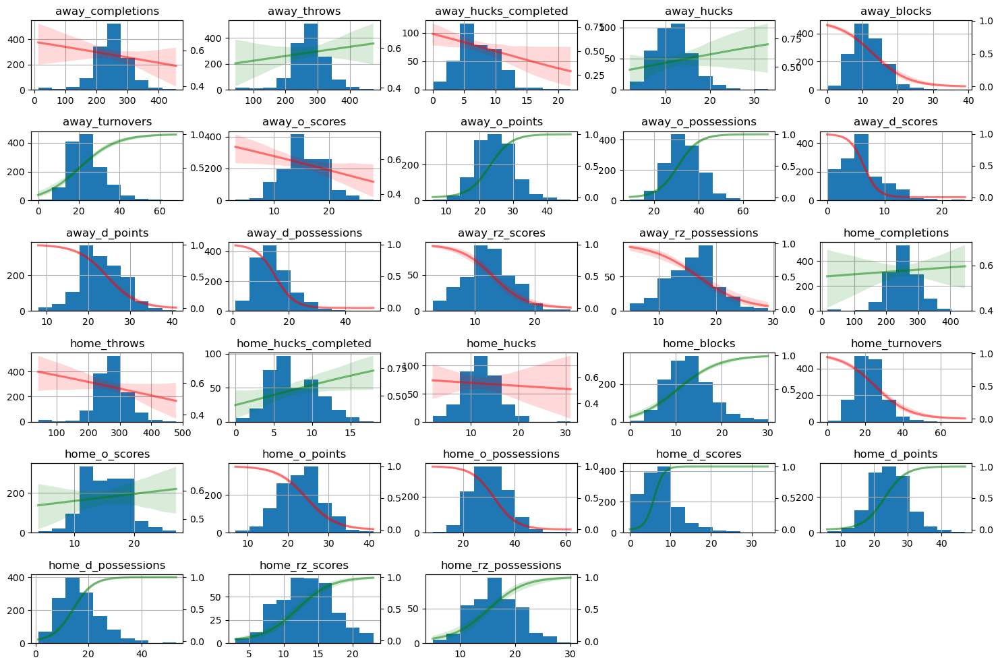

Wall time: 42.5 s


In [102]:
%%time
# all numerical feature except score
# distributions, reg fit vs home margin
# can adjust n_boot (default 1000) to decrease plotting time
# ex: try 250 for speed up
x = data.iloc[:,9:37].hist(figsize=(18,12))
plt.subplots_adjust(hspace=0.6)
for row in x:
    for graph in row:
        param = graph.title.get_text()
        if param:
            # indicate positive / negative relationship with green / red
            c = 'g' if data[[param,'home_win']].corr().iloc[0,1] > 0 else 'r' 
            sns.regplot(data, x=param, y='home_win', scatter=False, logistic=True,
                   ax = graph.twinx(), color=c, line_kws=dict(alpha=0.5), n_boot=250)
            plt.ylabel('')

plt.savefig(Path('graphs/EDA/basic_features_hist_vs_win.png'), dpi=300, bbox_inches='tight')
plt.show()

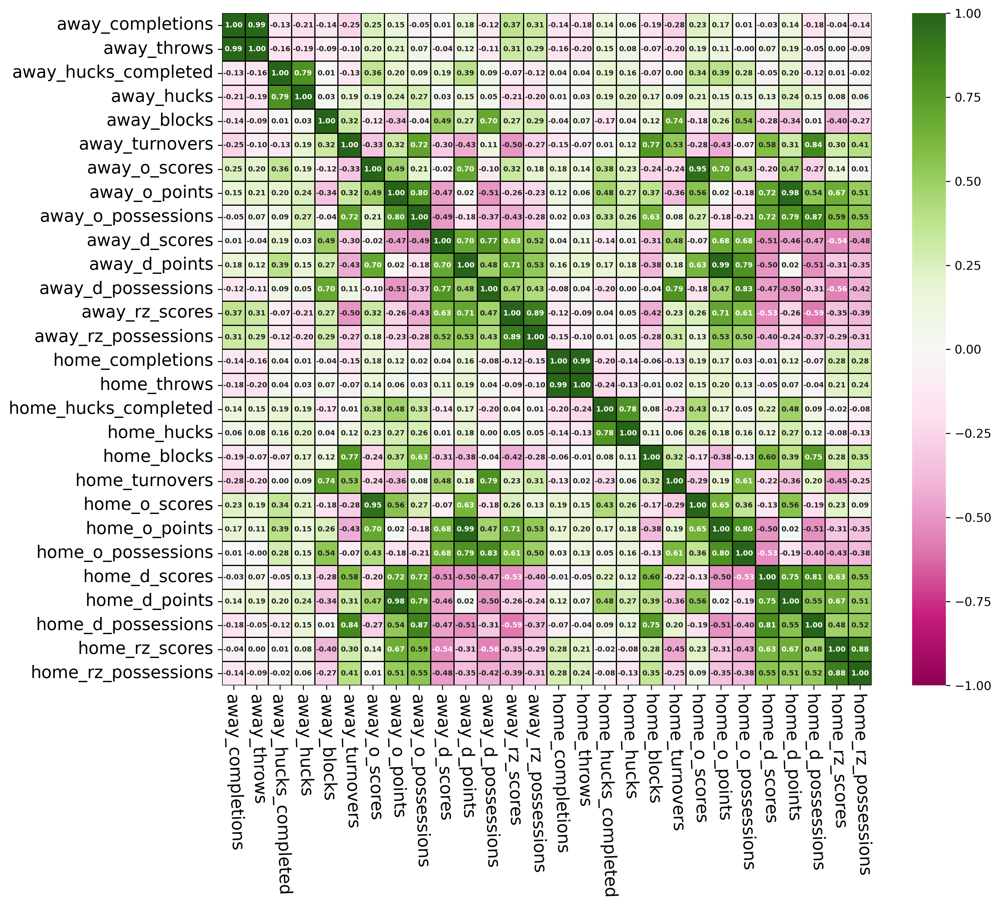

In [325]:
# basic feature correlation heat map
fig = plt.figure(figsize=(12,10), dpi=300)
sns.heatmap(data.iloc[:,9:37].corr(), cmap='PiYG', linecolor='k', linewidths=0.5,
           vmin=-1, vmax=1,yticklabels=True, xticklabels=True, fmt=".2f",
           annot=True, annot_kws=dict(fontsize=6,fontweight='bold'))
plt.tick_params(axis='x',labelrotation=-88)
plt.tick_params(axis='both',labelsize=14)
plt.savefig(Path('graphs/EDA/basic_features_corr_heatmap.png'), dpi=300, bbox_inches='tight')
plt.show()

 - Quick Notes
   - notice strong positive correlation between `home_o_scores` and `away_d_points`. with the exception of quarter ends, the latter event directly follows the former. therefore both features should not be kept for final model training.
     - however, `away_d_points` will be used in engineered features, such as `away_d_conversion`
     - with what frequency did the away team score when they were on defense
   - similar case for `home_d_possessions` vs `away_blocks`
   - these are the things to look for in preprocessing!

<Figure size 3600x3000 with 0 Axes>

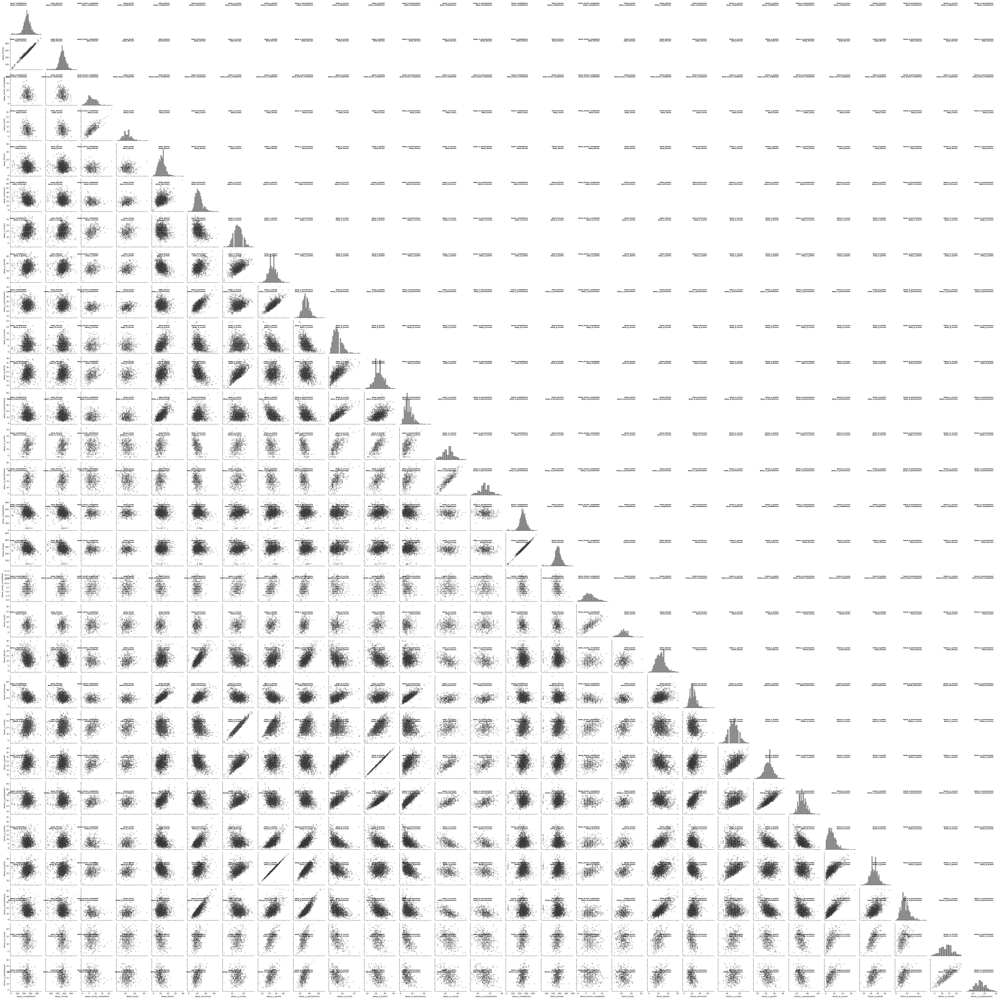

Wall time: 8min 10s


In [242]:
%%time
# basic feature pair plots, 20s to do columns 9:15
# columns 9:37, corner=True, figsize(12,10), dpi=300, takes > 8 mins 

# adjust column range as needed
i1=9 
i2=37

# info for labels
cols = data.columns[i1:i2]
ylabels = list(cols)
ylabels.reverse()

# pairplot
fig = plt.figure(figsize=(12,10), dpi=300)
sns.pairplot(data.iloc[:,i1:i2], corner=True,
             plot_kws=dict(color='k', alpha=0.2),
             diag_kws=dict(color='grey'))

# positions for labels
xl = np.linspace(1/len(cols), .985, len(cols))
yl = np.linspace(1/(len(cols)), .985, len(cols))

# add labels
for x,x_lab in zip(xl,cols):
    for y,y_lab in zip(yl, ylabels):
        plt.gcf().text(x,y,f'{x_lab}\n{y_lab}', fontweight='bold', ha='right',
                      fontsize=8,)

plt.savefig(Path('graphs/EDA/basic_features_PAIRPLOT.png'), dpi=300, bbox_inches='tight')
plt.show()

 - take notes based on pair plot
 - select a few features to evaluate with joint plots

## Derived Features
 - Combine obvious features for now, more intricate combinations/deletions later?
   - ex: throws completed / throws attempted = throw %
 - Repeat exercises above
 - should expect more intercorrelation, based on "Home/Away" definitions
   - *should not use all of these features in final model!*

In [248]:
ddata = pd.DataFrame(index=data.index)
ddata['home_margin'] = data.home_margin
ddata['home_win'] = data.home_win

In [249]:
### OFFENSE

# comp %
ddata['home_completion_rate'] = data.home_completions / data.home_throws
ddata['away_completion_rate'] = data.away_completions / data.away_throws

# huck %
ddata['home_huck_rate'] = data.home_hucks_completed / data.home_hucks
ddata['away_huck_rate'] = data.away_hucks_completed / data.away_hucks

# hold %
ddata['home_hold_rate'] = data.home_o_scores / data.home_o_points
ddata['away_hold_rate'] = data.away_o_scores / data.away_o_points

# O Line possessions per hold
ddata['home_o_poss_per_hold'] = data.home_o_possessions / data.home_o_scores
ddata['away_o_poss_per_hold'] = data.away_o_possessions / data.away_o_scores

### DEFENSE

# block %
ddata['home_block_rate'] = data.home_blocks / data.away_throws
ddata['away_block_rate'] = data.away_blocks / data.home_throws

# break %, games not perfectly symmetrical so calculate in addition to hold %
ddata['home_break_rate'] = data.home_d_scores / data.home_d_points
ddata['away_break_rate'] = data.away_d_scores / data.away_d_points

# D Line possessions per point
ddata['home_d_poss_per_hold'] = data.home_d_possessions / data.home_d_points
ddata['away_d_poss_per_hold'] = data.away_d_possessions / data.away_d_points

# D Line breaks per possession
ddata['home_break_per_poss'] = data.home_d_scores / data.home_d_possessions
ddata['away_break_per_poss'] = data.away_d_scores / data.away_d_possessions

### REDZONE

# redzone efficiency
ddata['home_rz_rate'] = data.home_rz_scores / data.home_rz_possessions
ddata['away_rz_rate'] = data.away_rz_scores / data.away_rz_possessions

In [250]:
ddata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1359 entries, 2059 to 3016
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   home_margin           1359 non-null   int32  
 1   home_win              1359 non-null   bool   
 2   home_completion_rate  1353 non-null   float64
 3   away_completion_rate  1353 non-null   float64
 4   home_huck_rate        373 non-null    float64
 5   away_huck_rate        373 non-null    float64
 6   home_hold_rate        1358 non-null   float64
 7   away_hold_rate        1354 non-null   float64
 8   home_o_poss_per_hold  1358 non-null   float64
 9   away_o_poss_per_hold  1354 non-null   float64
 10  home_block_rate       1353 non-null   float64
 11  away_block_rate       1353 non-null   float64
 12  home_break_rate       1358 non-null   float64
 13  away_break_rate       1354 non-null   float64
 14  home_d_poss_per_hold  1358 non-null   float64
 15  away_d_poss_per_ho

In [300]:
# Correlation Table for target features
ddata.corr(numeric_only=True).iloc[:2,2:].T.style\
        .background_gradient(cmap = 'PiYG', vmin=-1,vmax=1)\
        .format(formatter="{:.3f}")

,home_margin,home_win
home_completion_rate,0.187,0.178
away_completion_rate,-0.290,-0.197
home_huck_rate,0.194,0.162
away_huck_rate,-0.253,-0.230
home_hold_rate,0.752,0.617
away_hold_rate,-0.802,-0.618
home_o_poss_per_hold,-0.538,-0.447
away_o_poss_per_hold,0.624,0.395
home_block_rate,0.322,0.236
away_block_rate,-0.238,-0.222


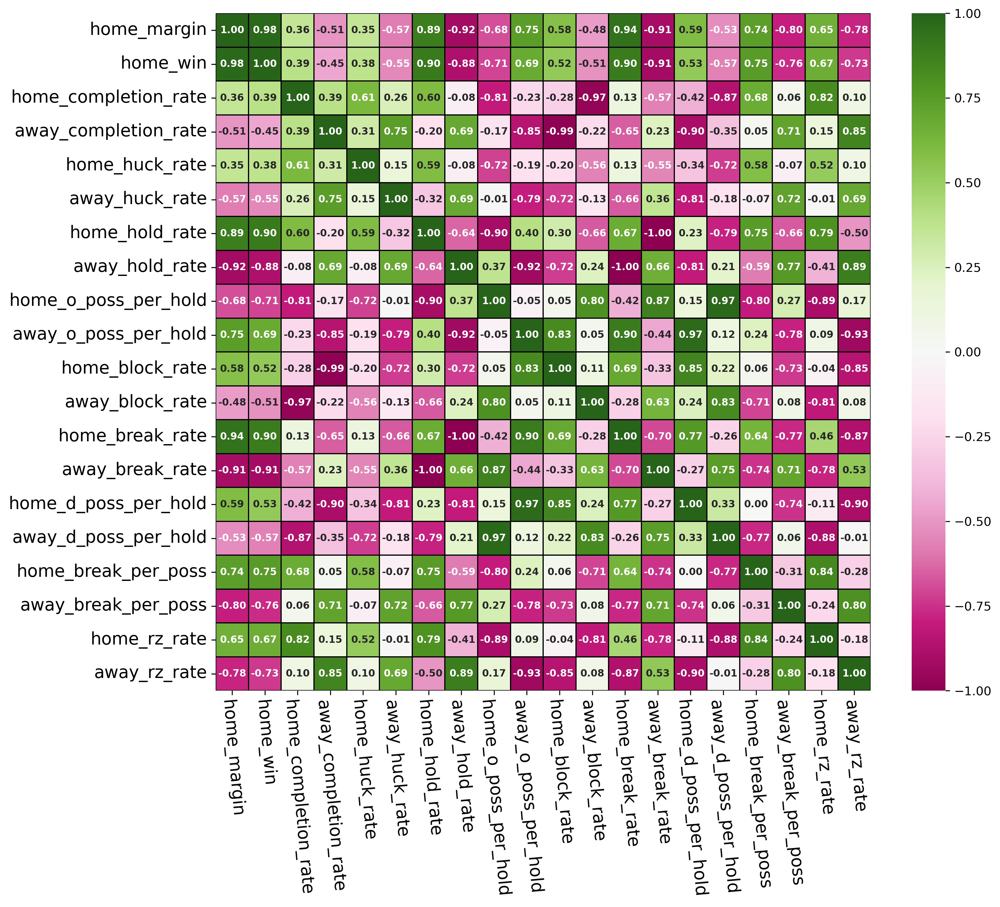

In [324]:
# basic feature correlation heat map
fig = plt.figure(figsize=(12,10), dpi=300)
sns.heatmap(ddata.corr(numeric_only=True).corr(), cmap='PiYG', linecolor='k', linewidths=0.5,
           vmin=-1, vmax=1,yticklabels=True, xticklabels=True,  fmt=".2f",
           annot=True, annot_kws=dict(fontsize=8,fontweight='bold'))
plt.tick_params(axis='x',labelrotation=-85)
plt.tick_params(axis='both',labelsize=14)
plt.savefig(Path('graphs/EDA/derived_features_corr_heatmap.png'), dpi=300, bbox_inches='tight')
plt.show()

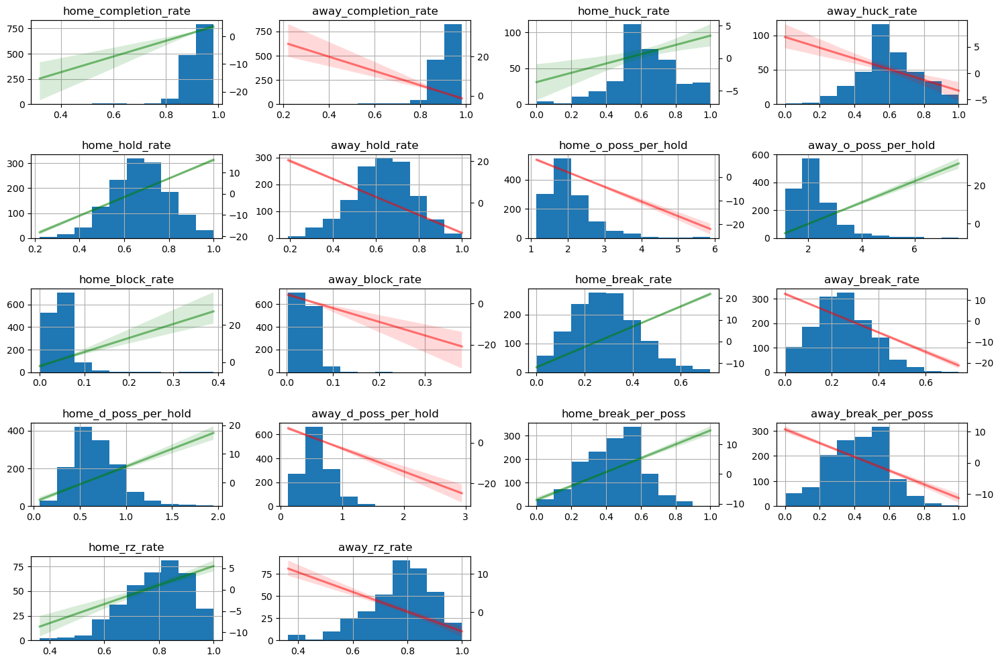

In [251]:
# all numerical feature except score
# distributions, reg fit vs home margin
x = ddata.iloc[:,2:].hist(figsize=(18,12))
plt.subplots_adjust(hspace=0.6)
for row in x:
    for graph in row:
        param = graph.title.get_text()
        if param:
            # indicate positive / negative relationship with green / red
            c = 'g' if ddata[[param,'home_margin']].corr().iloc[0,1] > 0 else 'r' 
            sns.regplot(ddata, x=param, y='home_margin', scatter=False,
                   ax = graph.twinx(), color=c, line_kws=dict(alpha=0.5))
            plt.ylabel('')

plt.savefig(Path('graphs/EDA/derived_features_hist_vs_margin.png'), dpi=300, bbox_inches='tight')
plt.show()

*should I try any simple transformations of the features to better assess distributions?*

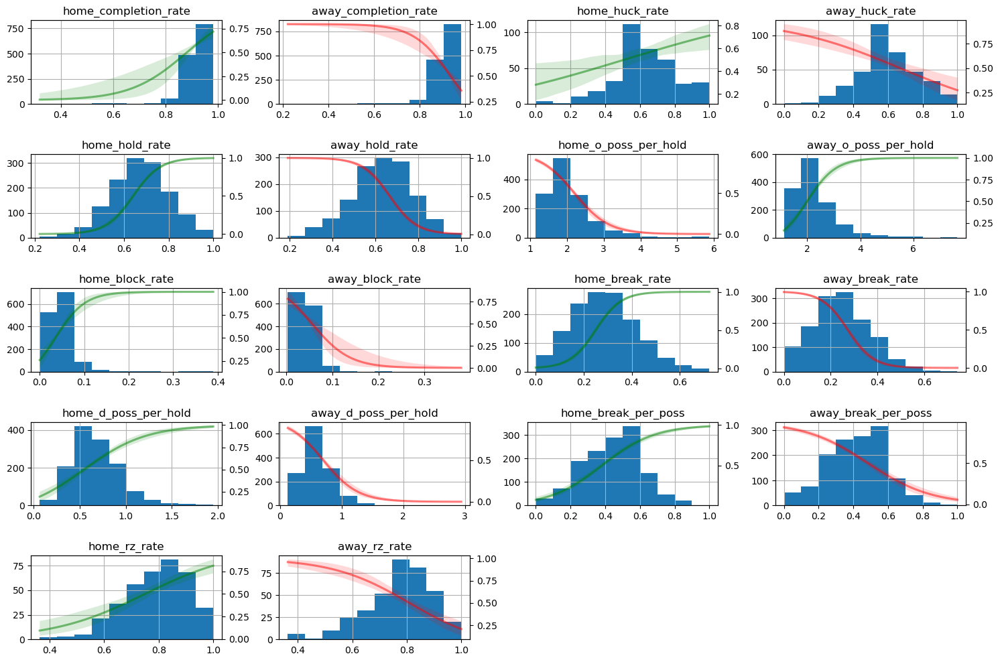

Wall time: 35.8 s


In [295]:
%%time
# all numerical feature except score
# distributions, reg fit vs home margin
# can adjust n_boot (default 1000) to decrease plotting time
# ex: try 250 for speed up
x = ddata.iloc[:,2:].hist(figsize=(18,12))
plt.subplots_adjust(hspace=0.6)
for row in x:
    for graph in row:
        param = graph.title.get_text()
        if param:
            # indicate positive / negative relationship with green / red
            c = 'g' if ddata[[param,'home_win']].corr().iloc[0,1] > 0 else 'r' 
            sns.regplot(ddata, x=param, y='home_win', scatter=False, logistic=True,
                   ax = graph.twinx(), color=c, line_kws=dict(alpha=0.5), n_boot=250)
            plt.ylabel('')

plt.savefig(Path('graphs/EDA/derived_features_hist_vs_win.png'), dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# all numerical feature except score
# distributions, reg fit vs home margin
x = ddata.iloc[:,2:].hist(figsize=(18,12))
plt.subplots_adjust(hspace=0.6)
for row in x:
    for graph in row:
        param = graph.title.get_text()
        if param:
            # indicate positive / negative relationship with green / red
            c = 'g' if ddata[[param,'home_margin']].corr().iloc[0,1] > 0 else 'r' 
            sns.regplot(ddata, x=param, y='home_margin', scatter=False,
                   ax = graph.twinx(), color=c, line_kws=dict(alpha=0.5))
            plt.ylabel('')

plt.savefig(Path('graphs/EDA/derived_features_hist_vs_margin.png'), dpi=300, bbox_inches='tight')
plt.show()

<Figure size 3600x3000 with 0 Axes>

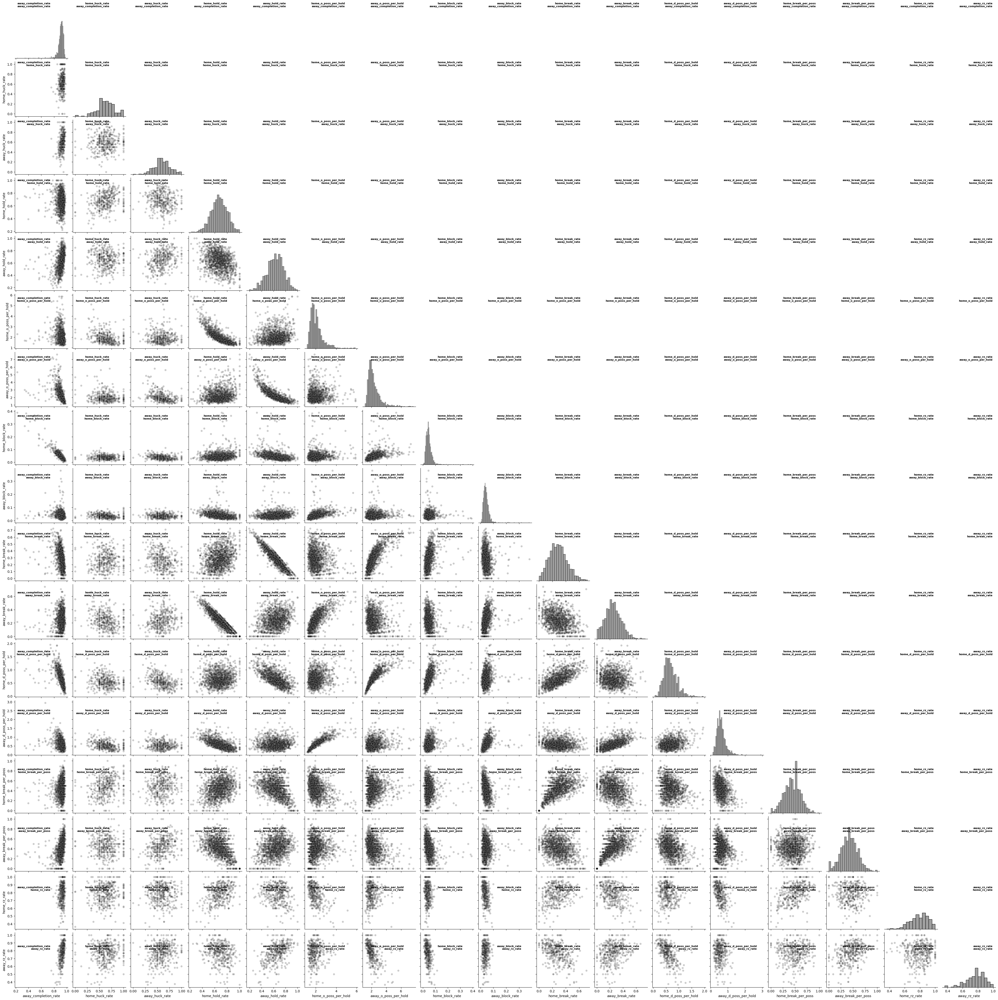

Wall time: 2min 22s


In [328]:
%%time
# basic feature pair plots, 20s to do columns 9:15
# columns 9:37, corner=True, figsize(12,10), dpi=300, takes > 8 mins 

# adjust column range as needed
i1=3 
i2=20

# info for labels
cols = ddata.columns[i1:i2]
ylabels = list(cols)
ylabels.reverse()

# pairplot
fig = plt.figure(figsize=(12,10), dpi=300)
sns.pairplot(ddata.iloc[:,i1:i2], corner=True,
             plot_kws=dict(color='k', alpha=0.2),
             diag_kws=dict(color='grey'))

# positions for labels
xl = np.linspace(1/len(cols), .985, len(cols))
yl = np.linspace(1/(len(cols)), .985, len(cols))

# add labels
for x,x_lab in zip(xl,cols):
    for y,y_lab in zip(yl, ylabels):
        plt.gcf().text(x,y,f'{x_lab}\n{y_lab}', fontweight='bold', ha='right',
                      fontsize=8,)

plt.savefig(Path('graphs/EDA/derived_features_PAIRPLOT.png'), dpi=300, bbox_inches='tight')
plt.show()

 - Make final adjustments to derived stats
 - combine data below

## PCA
 - Combine cleaned dataset and added features
   - save final data frames in `/data/`
 - Perform PCA, analyze results
   - feature analysis

In [330]:
ddata.drop(columns=['home_margin','home_win'],inplace=True)

In [336]:
data = data.merge(ddata, left_index=True, right_index=True)

In [337]:
data.to_parquet(f'data/game_stats_0.parquet', engine='pyarrow', compression='gzip')

## Fidings
 - TBD
 - later

## Selected Features